# Clustering Analysis of Ganglion Cells in the Retina
- **Author:** David Felipe
- **Contact:** https://github.com/davidnfu0
- **Last Modification:** January 25, 2024
- **Description:** This document is dedicated to performing an individual analysis of each cluster previously identified. The goal is to discern the distinct characteristics of each cluster and to identify the types of ganglion cells present in the retina. This analysis will be conducted from two perspectives:

    - **Spike-Triggered Average (STA):** Each cluster's STA will be examined to determine if it is possible to identify the type of ganglion cell. This involves analyzing aspects such as the receptive field (RF) and its shape, or the pattern of contrast preceding a spike.
    
    - **Chirp Stimulus Response:** The response of each cluster to the chirp stimulus will be analyzed to see if it can help in identifying the type of ganglion cell. This includes studying the temporal dynamics and response patterns of the cells when exposed to this particular stimulus.

The comprehensive approach combining both STA and Chirp Stimulus Response analyses will provide a robust framework for understanding the functional diversity and characteristics of ganglion cells in the retina. This could have significant implications for both basic neuroscience research and clinical studies in ophthalmology.


## Introduction

### Importing Libraries

In [1]:
import sys
import pickle
import matplotlib.pyplot as plt
import pandas as pd

C:\Users\David\AppData\Local\Temp\ipykernel_12344\1688518519.py:4: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
sys.path.append("../..")

In [3]:
from scripts import load_yaml_config, hide_warnings
from scripts.clustering import (
    clustering_dict_table,
    plot_contrast_cluster,
    plot_elipses,
    calculate_cluster_statistics,
    plot_columns_cluster_histograms,
    plot_cluster_stim_bins
)

c:\Users\David\miniconda3\envs\ganglion-venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Paths and configuration

In [4]:
plt.style.use("seaborn-v0_8-darkgrid")

In [5]:
configPath = "../../config/"
config = load_yaml_config(configPath + "general_config.yml")

### Control Panel
This control panel is designed to facilitate the selection of specific data frames and models for analysis. It functions as an integral part of the workflow, allowing users to dynamically choose the datasets and models they wish to examine. This panel should have been created in the previous notebook, ensuring a seamless transition and efficient interaction with the data. 

In [6]:
control_panel = load_yaml_config(configPath + "clustering_control_panel.yml")

### Loading the data

In [8]:
df_sta = pd.read_csv("../.." + config["paths"]["data"]["sta_og_df"])
df_chirp = pd.read_csv("../.." + config["paths"]["data"]["chirp_df"])

with open("../.." + config["paths"]["data_cache"]["clustering"]["DFS"], "rb") as file:
    dfs = pickle.load(file)
with open("../.." + config["paths"]["data_cache"]["clustering"]["PREDS"], "rb") as file:
    clustering_pred = pickle.load(file)
with open("../.." + config["paths"]["data_cache"]["FUNC_VALUES"], "rb") as file:
    FUNC_DATA = pickle.load(file)
with open("../.." + config["paths"]["data_cache"]["POLY_VALUES"], "rb") as file:
    POLY_DATA = pickle.load(file)
with open("../.." + config["paths"]["data_cache"]["T_DATA_STA"], "rb") as file:
    T_DATA_STA = pickle.load(file)
with open("../.." + config["paths"]["data_cache"]["RFS"], "rb") as file:
    RFS = pickle.load(file)

## Clusters analysis

### Spike-Triggered Average (STA) Analysis
We begin with the analysis of the Spike-Triggered Average (STA). This step marks the initial phase of our in-depth investigation into the neural response characteristics of the ganglion cells. The STA analysis is pivotal in understanding how these cells respond to visual stimuli, as it reveals the average stimulus that precedes a neuron's firing. By examining the STA, we aim to uncover patterns and features that are indicative of the different types of ganglion cells in the retina. This analysis is not only crucial for identifying the unique properties of each cluster but also for gaining insights into the functional diversity of the retinal neurons.

#### Ellipses and Contrast Curves
In this section, we display the ellipses and contrast curves for each cluster. The contrast curves are presented in two formats: their raw form and versions generated through functions fitted to the data. One of these functions is a polynomial, tailored to closely match the observed data points. The other function is based on a predefined model described in a specific research paper.

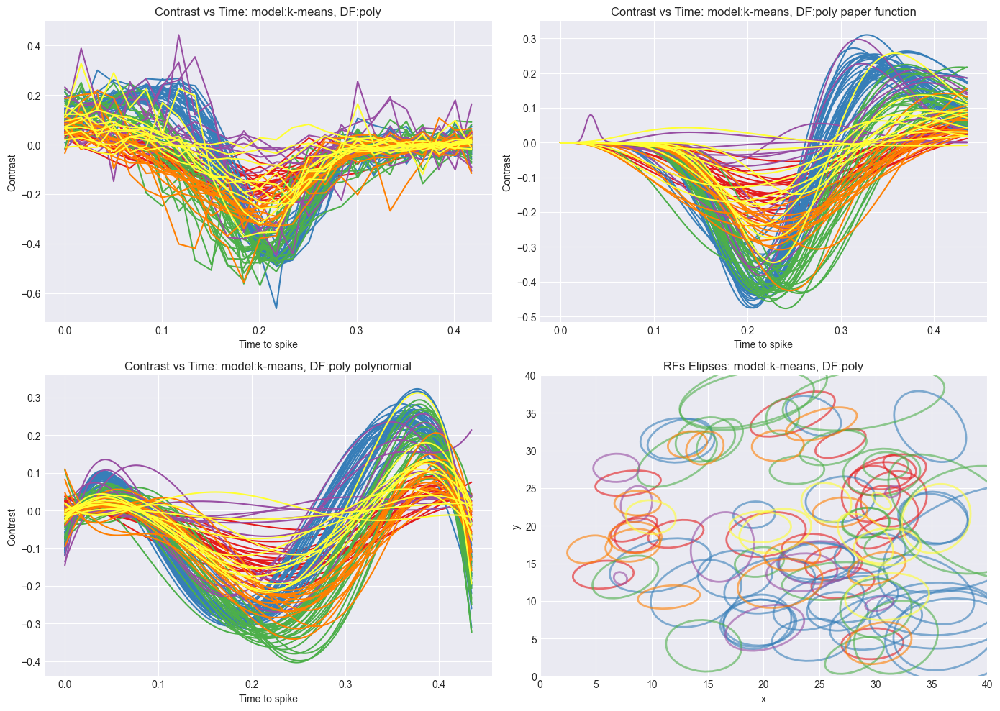

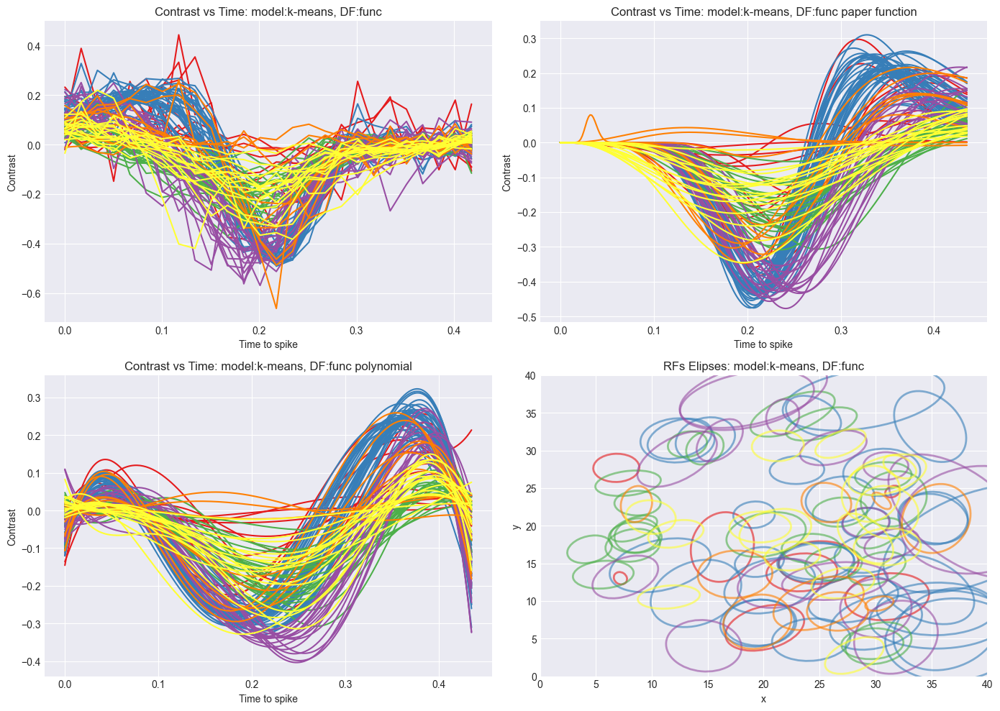

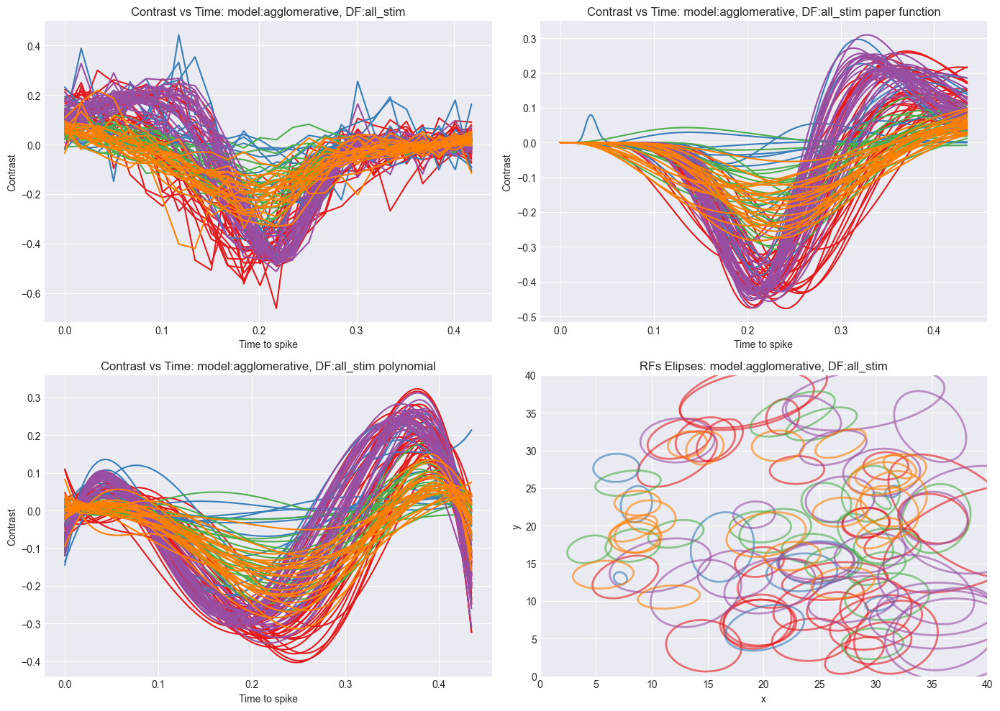

In [9]:
hide_warnings()
for df_name in dfs.keys():
    for model in clustering_pred.keys():
        if control_panel[df_name][model] and df_name != "only_chirp":
            columns = 2
            rows = 2
            plot_number = 1
            figure_size = (columns * 7, rows * 5)

            _, axs = plt.subplots(ncols=columns, nrows=rows, figsize=figure_size)
            plot_contrast_cluster(
                title=f"Contrast vs Time: model:{model}, DF:{df_name}",
                axs=axs,
                contrast_dict=T_DATA_STA["contrast"],
                model_labels=clustering_pred[model][df_name],
                X=dfs[df_name],
                time=T_DATA_STA["time"],
                subplot_coords=(0, 0),
            )
            plot_contrast_cluster(
                title=f"Contrast vs Time: model:{model}, DF:{df_name} paper function",
                axs=axs,
                contrast_dict=FUNC_DATA,
                model_labels=clustering_pred[model][df_name],
                X=dfs[df_name],
                time=T_DATA_STA["time_cont"],
                subplot_coords=(0, 1),
            )
            plot_contrast_cluster(
                title=f"Contrast vs Time: model:{model}, DF:{df_name} polynomial",
                axs=axs,
                contrast_dict=POLY_DATA,
                model_labels=clustering_pred[model][df_name],
                X=dfs[df_name],
                time=T_DATA_STA["time_cont"],
                subplot_coords=(1, 0),
            )

            plot_number += 1
            plot_elipses(
                title=f"RFs Elipses: model:{model}, DF:{df_name}",
                axs=axs,
                rfs=RFS,
                X=dfs[df_name],
                model_labels=clustering_pred[model][df_name],
                subplot_coords=(1, 1),
            )
            plt.tight_layout()
            plt.show()

#### RFs Histograms
In this part of the analysis, we focus on the histograms of the Receptive Fields (RFs) for each cluster. These histograms provide a quantitative representation of the distribution and variation of receptive field properties across different clusters of ganglion cells. By examining the RF histograms, we can identify common patterns, outliers, and unique characteristics within each cluster. This analysis is crucial for understanding the spatial and temporal aspects of visual processing in the retina. It enables us to compare and contrast the receptive field sizes, shapes, and other key parameters, thereby offering insights into the functional diversity of retinal ganglion cells and their roles in visual perception.

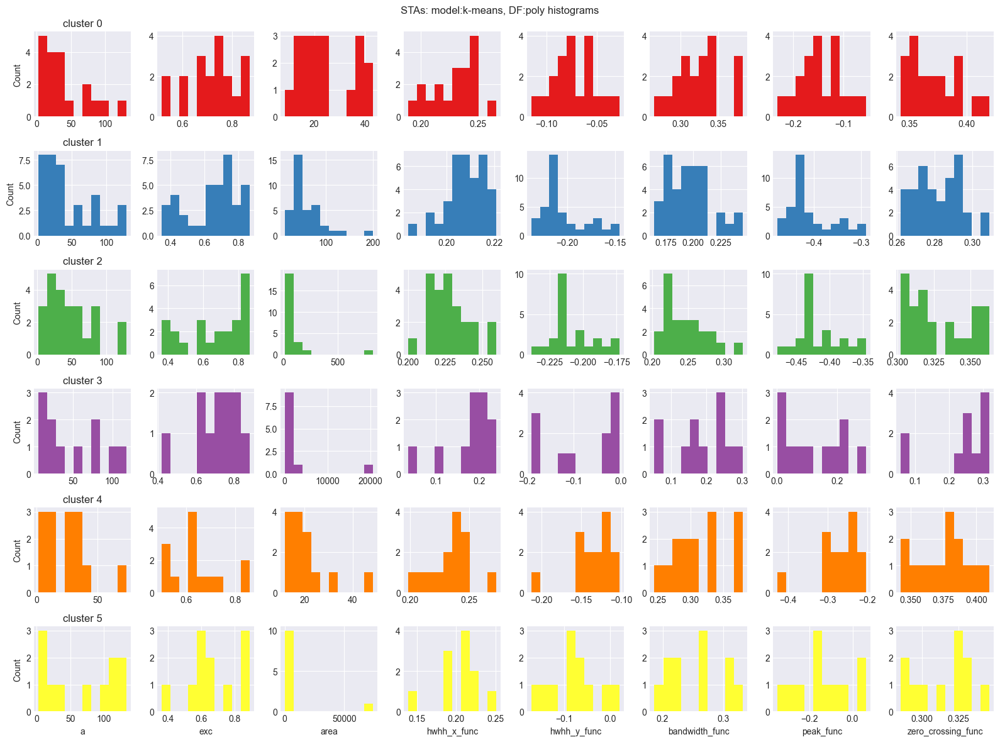

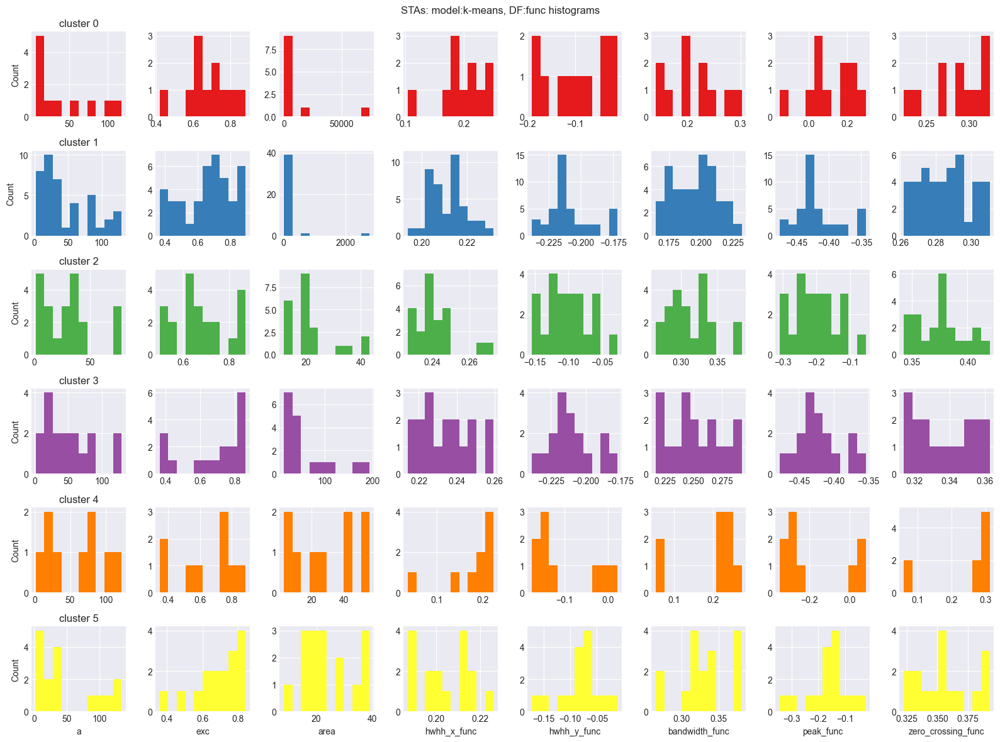

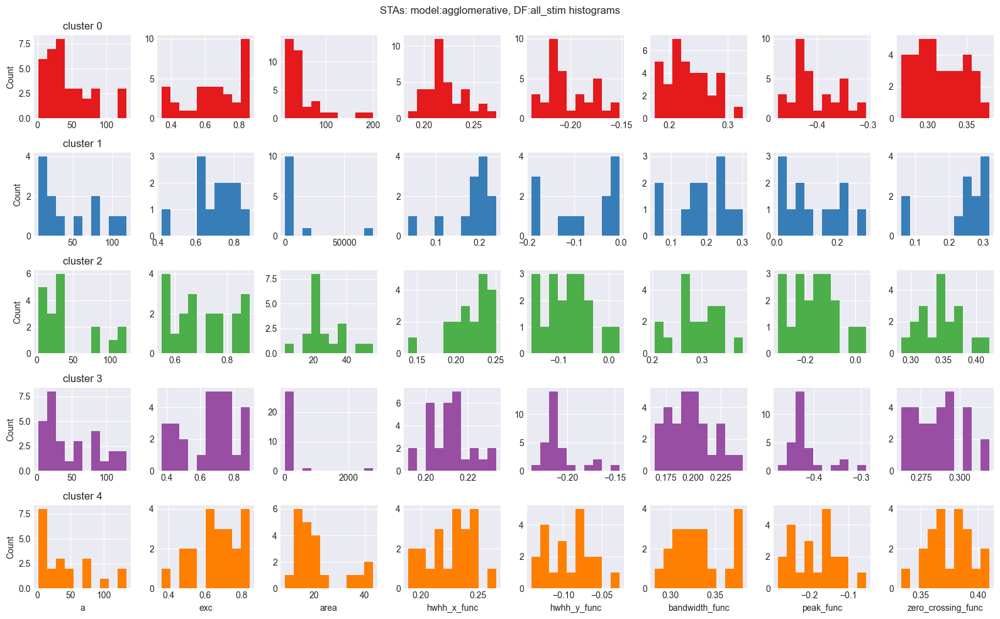

In [10]:
columns_list = [
    "a",
    "exc",
    "area",
    "hwhh_x_func",
    "hwhh_y_func",
    "bandwidth_func",
    "peak_func",
    "zero_crossing_func",
]
for df_name in dfs.keys():
    for model in clustering_pred.keys():
        if control_panel[df_name][model] and df_name != "only_chirp":
            plot_columns_cluster_histograms(
                title=f"STAs: model:{model}, DF:{df_name}",
                df=dfs[df_name],
                df_cols=df_sta,
                model_labels=clustering_pred[model][df_name],
                columns_list=columns_list,
            )

#### RFs Tables
By integrating these quantitative insights with the heatmap's visual clarity, we can effectively compare the RF characteristics of different ganglion cell clusters. This comparison is essential for identifying subtle differences and potential patterns that might not be evident from numerical data alone, thus offering a more nuanced understanding of the complex interplay between different ganglion cell types and their corresponding receptive fields.


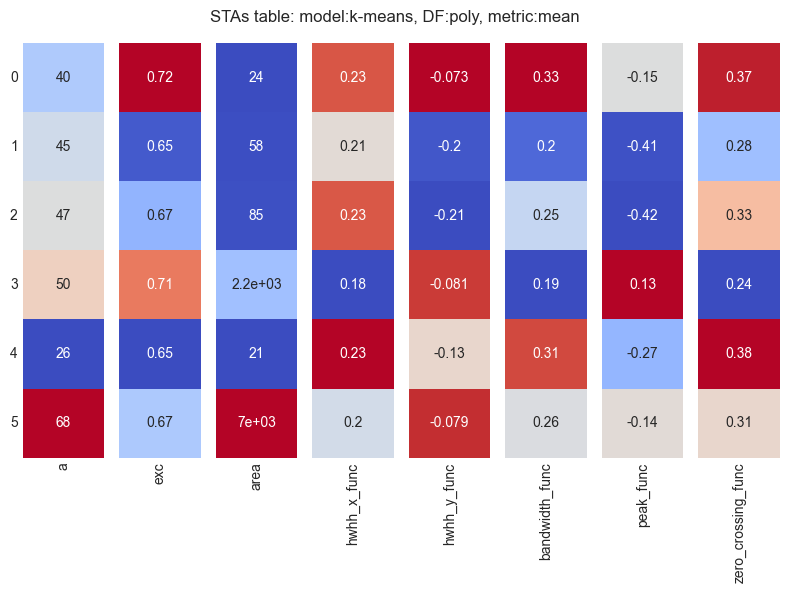

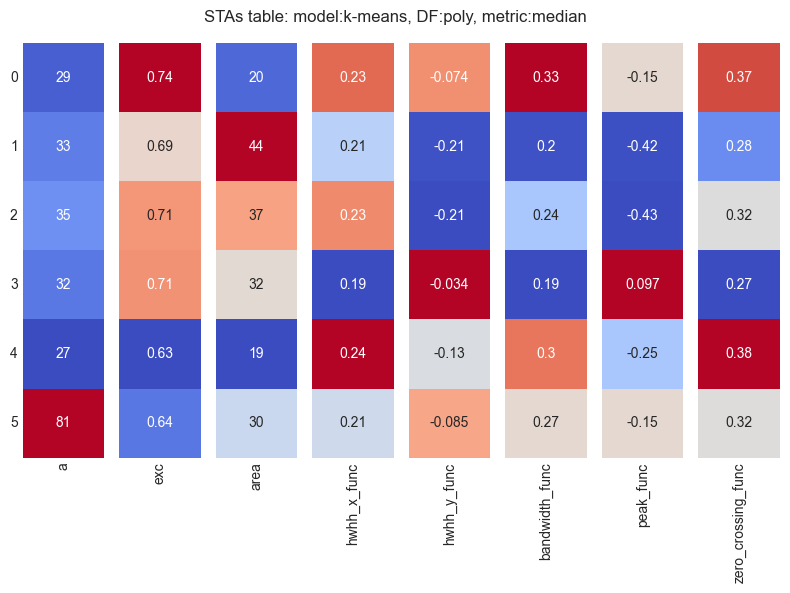

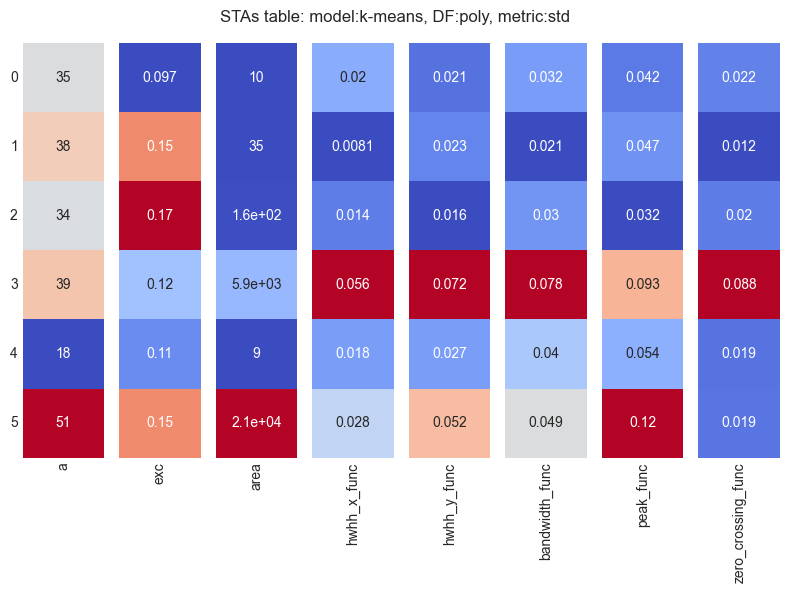

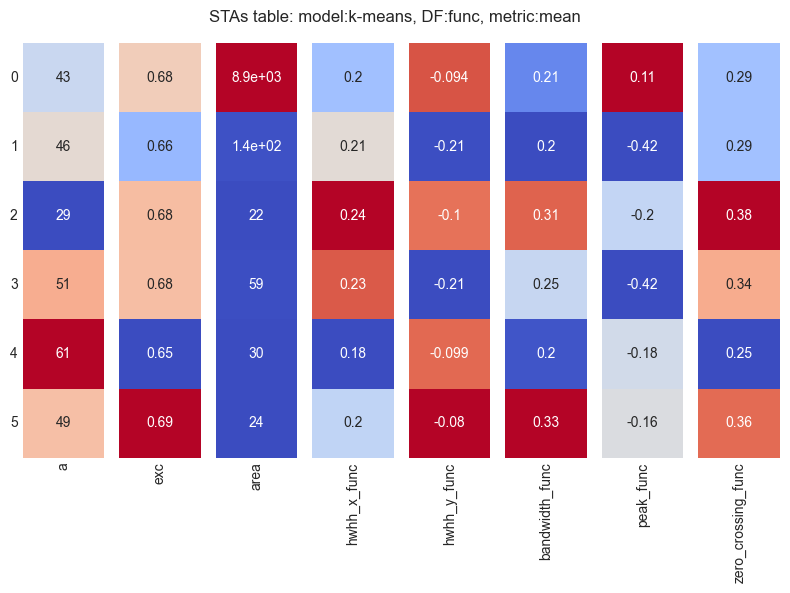

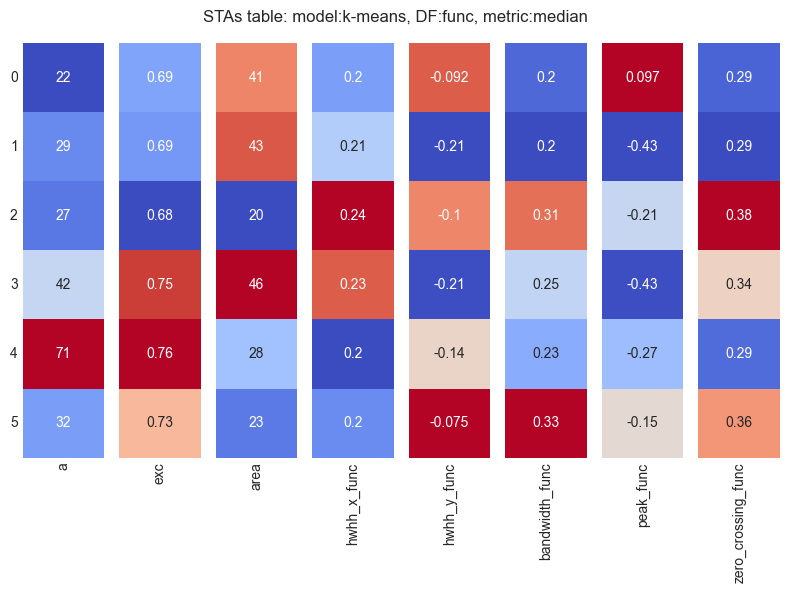

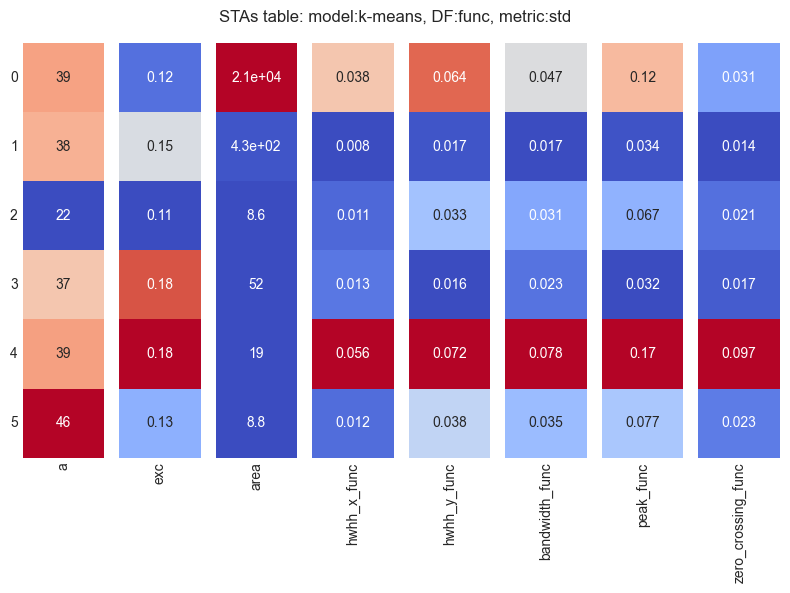

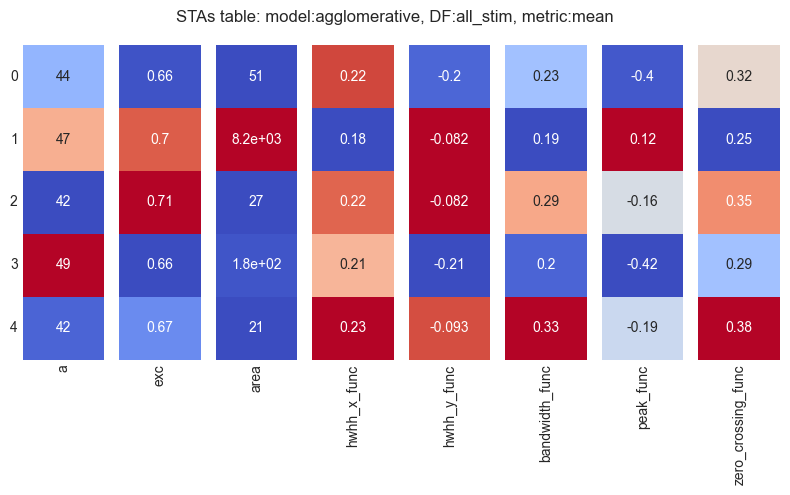

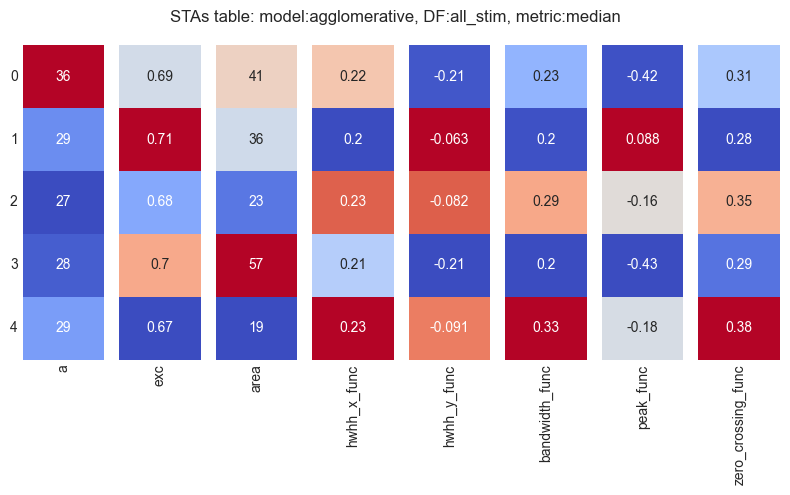

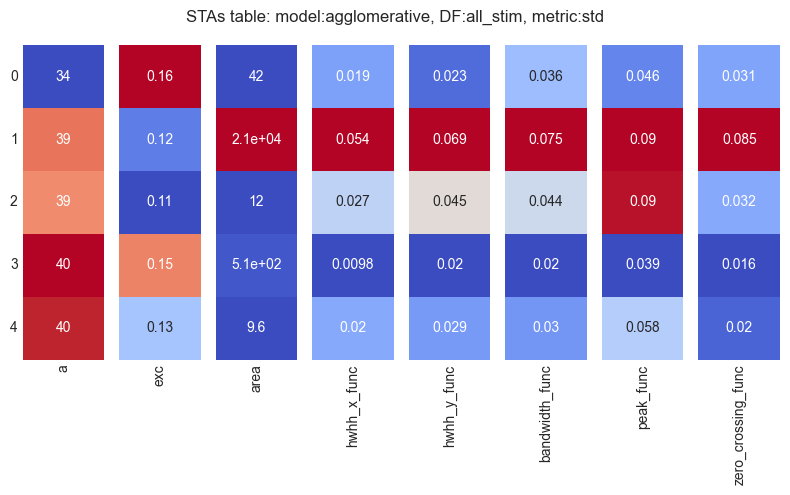

In [11]:
metric_df_dict = dict()
columns_list = [
    "a",
    "exc",
    "area",
    "hwhh_x_func",
    "hwhh_y_func",
    "bandwidth_func",
    "peak_func",
    "zero_crossing_func",
]
for df_name in dfs.keys():
    for model in clustering_pred.keys():
        if control_panel[df_name][model] and df_name != "only_chirp":
            metric_df_dict[df_name] = calculate_cluster_statistics(
                df=dfs[df_name],
                df_cols=df_sta,
                model_labels=clustering_pred[model][df_name],
                columns_list=columns_list,
            )
            for metric, data in metric_df_dict[df_name].items():
                clustering_dict_table(
                    title=f"STAs table: model:{model}, DF:{df_name}, metric:{metric.lower()}",
                    data=data,
                )

### Chirp Stimulus Analysis
We will now proceed with the analysis of each cluster's response to the chirp stimulus. 

#### Chirp Stimulus Response Tables
These tables visually depict the average response of each cluster to each bin of sub-stimuli within the chirp stimulus. Color coding ranges from blue for the weakest response to red for the strongest response. The value in each cell represents the mean response of the cluster to each sub-stimulus bin within the chirp stimulus.

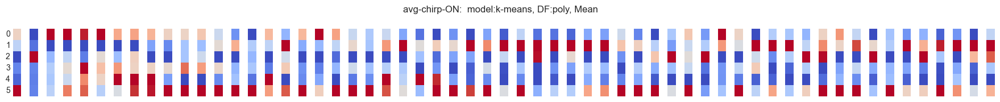

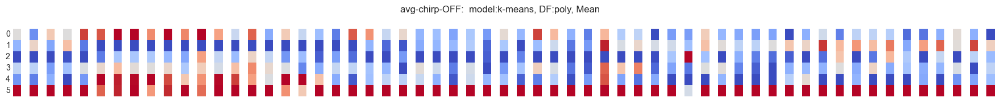

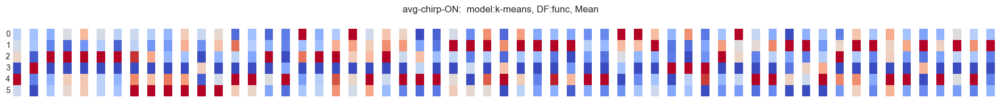

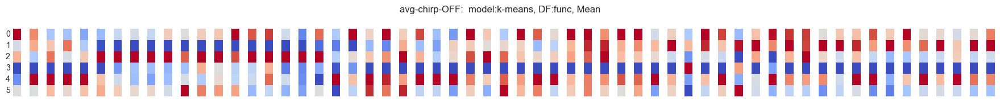

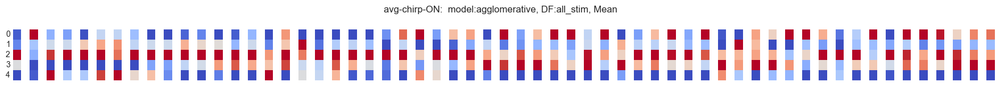

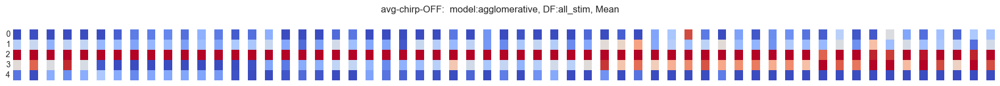

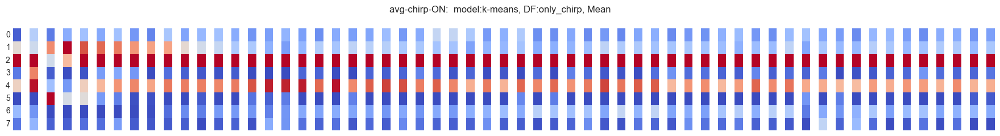

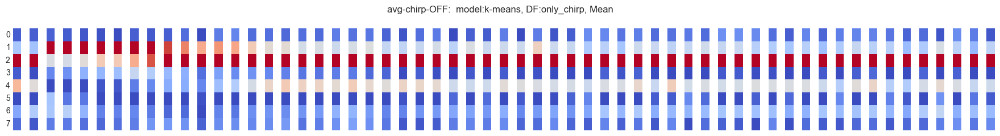

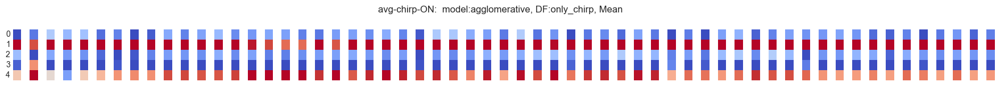

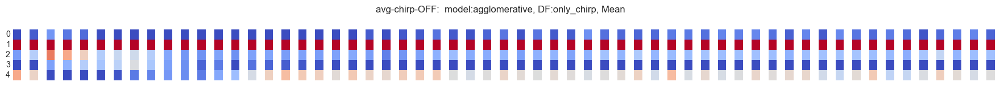

In [12]:
metric = "Mean"
chirp_subevents = ["ON", "OFF"]
chirp_subevents_bins = [60, 60]
for df_name in dfs.keys():
    for model in clustering_pred.keys():
        for i, subevent in enumerate(chirp_subevents):
            columns_list = [
                f"avg-chirp.{subevent}-bin_{i}" for i in range(0, chirp_subevents_bins[i] - 1)
            ]
            if control_panel[df_name][model]:
                metric_df_dict[df_name] = calculate_cluster_statistics(
                    df=dfs[df_name],
                    df_cols=df_chirp,
                    model_labels=clustering_pred[model][df_name],
                    columns_list=columns_list,
                )
                clustering_dict_table(
                    title=f"avg-chirp-{subevent}:  model:{model}, DF:{df_name}, {metric}",
                    data=metric_df_dict[df_name][metric],
                    show_annotations=False,
                    show_xlabels=False,
                    cell_size=0.3,
                )

#### Histograms of the Chirp Stimulus Response
These histograms illustrate the response distribution of each cluster to each bin of the sub-stimuli within the chirp stimulus. The values represented in each bin are the average responses of the clusters. Additionally, displayed below each histogram is a detailed breakdown of how each individual cell responds to each bin of the sub-stimuli, providing both a collective and a granular view of the clusters' dynamic responses to the chirp stimulus.

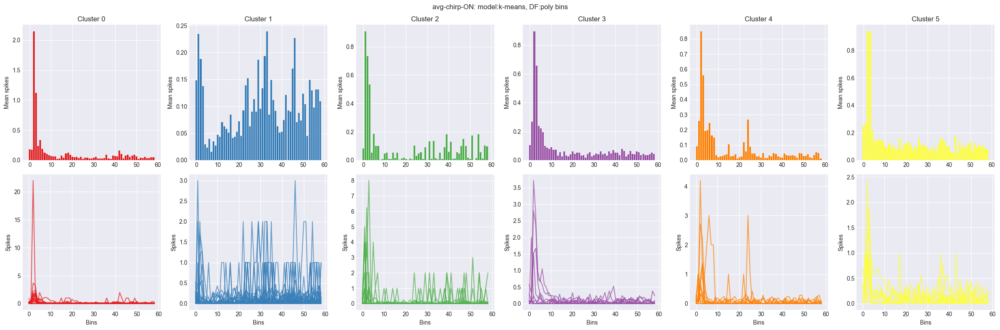

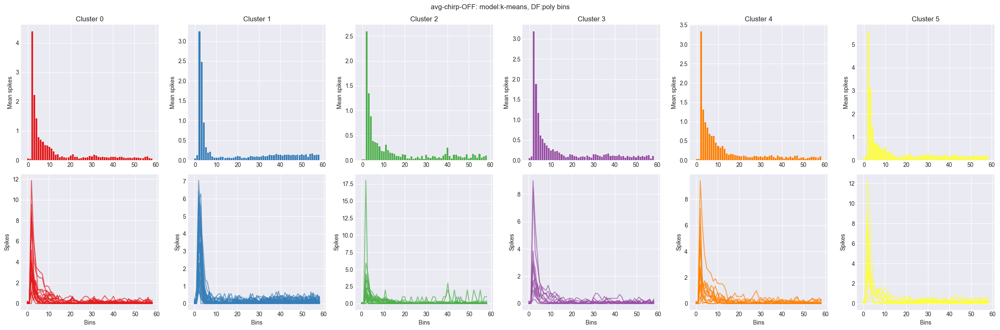

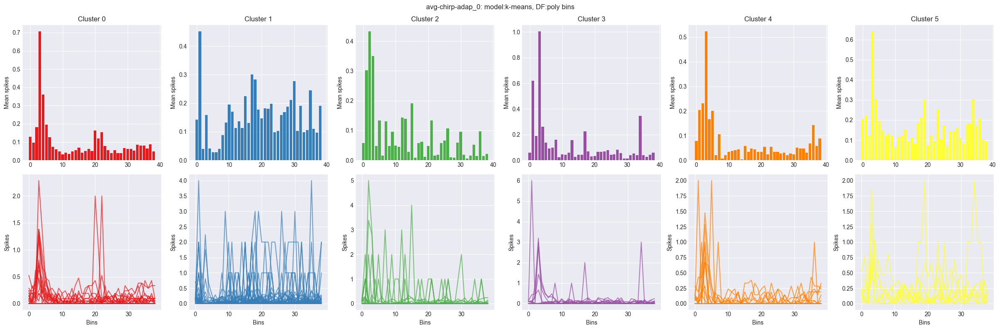

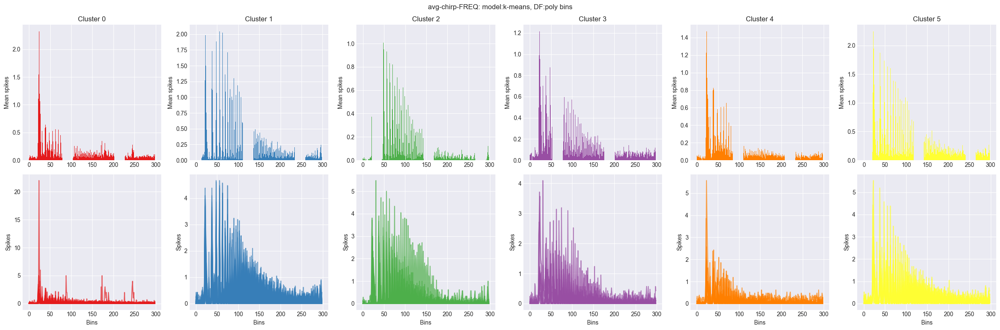

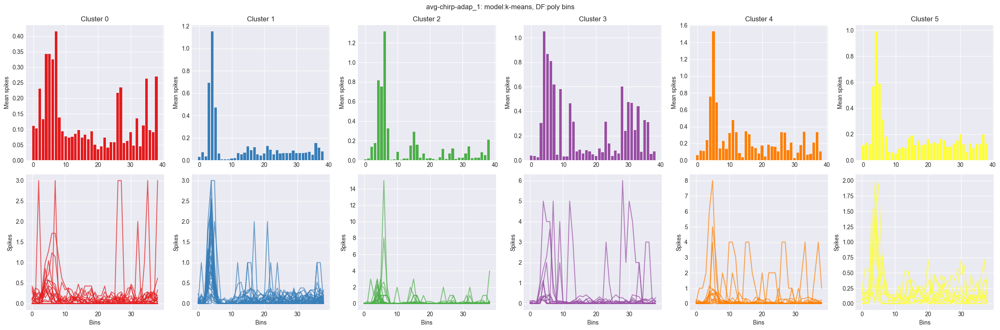

...

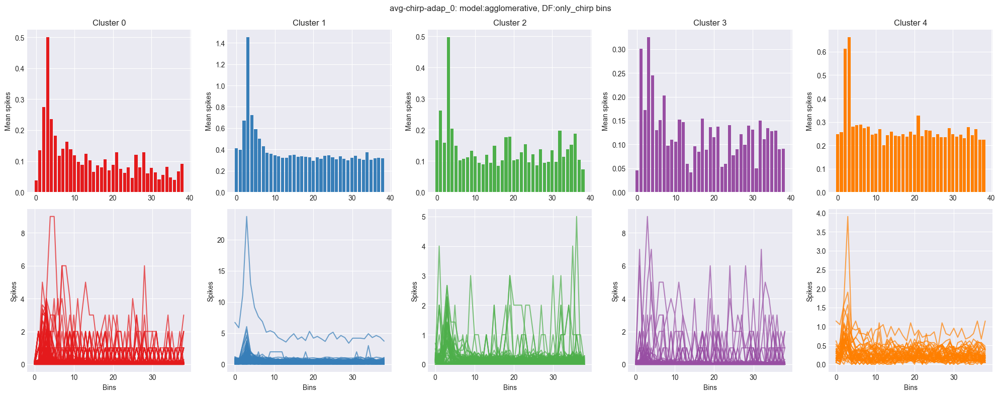

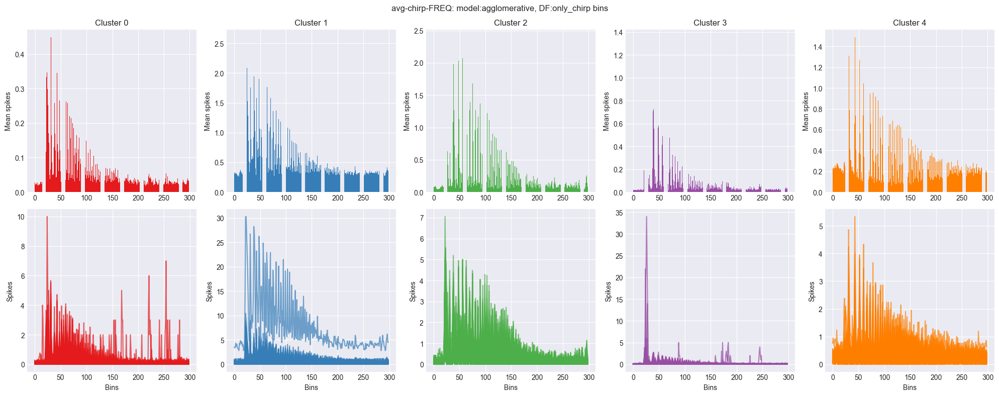

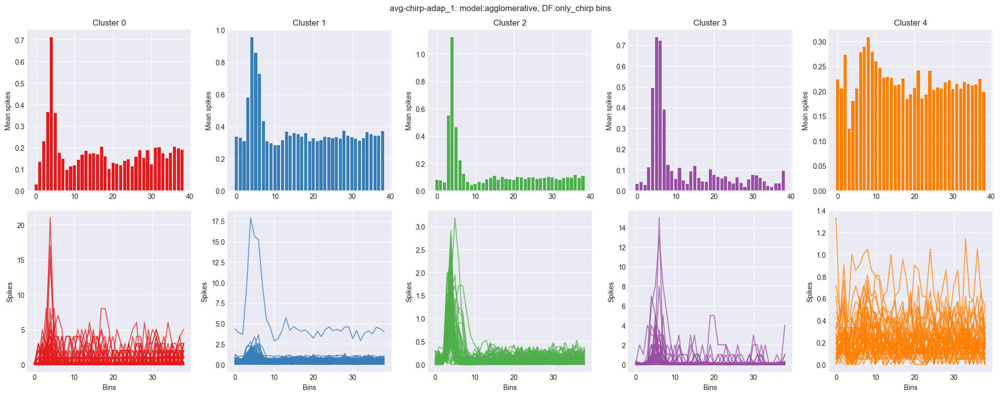

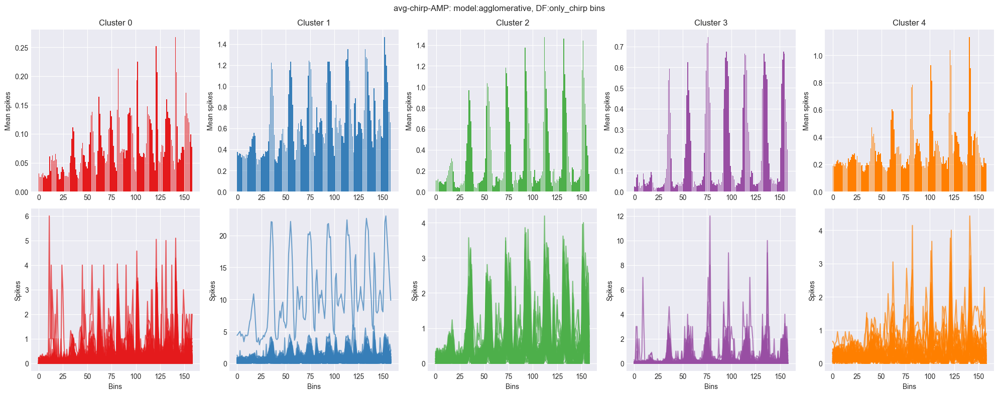

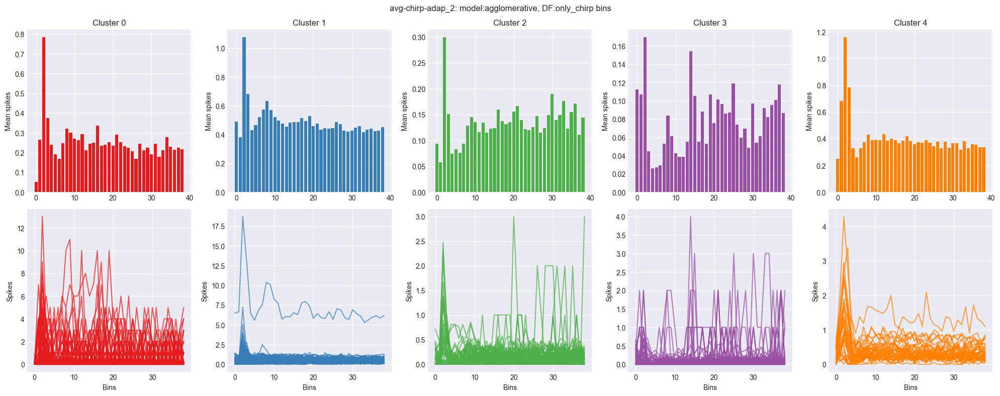

In [13]:
chirp_subevents = ["ON", "OFF", "adap_0", "FREQ", "adap_1", "AMP", "adap_2"]
chirp_subevents_bins = [60, 60, 40, 300, 40, 160, 40]
for df_name in dfs.keys():
    for model in clustering_pred.keys():
        for i, subevent in enumerate(chirp_subevents):
            columns_list = [
                f"avg-chirp.{subevent}-bin_{i}" for i in range(0, chirp_subevents_bins[i] - 1)
            ]
            if control_panel[df_name][model]:
                plot_cluster_stim_bins(
                    title=f"avg-chirp-{subevent}: model:{model}, DF:{df_name} bins",
                    df=dfs[df_name],
                    columns_bin_list=columns_list,
                    stim_df=df_chirp,
                    model_labels=clustering_pred[model][df_name],
                )

## Conclusions

___